In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [5]:
import os
import zipfile
import time

# Unzip the cats_and_dogs_filtered.zip file
with zipfile.ZipFile('/content/drive/MyDrive/Colab Notebooks/Dog_Cat/cats_and_dogs_filtered.zip', 'r') as zip_ref:
    zip_ref.extractall('/content')

import os
save_path = '/content/drive/MyDrive/Colab Notebooks/Dog_Cat'
if not os.path.exists(save_path):
    os.makedirs(save_path)

import torch
import torch.nn as nn
import torch.optim as optim
import torch.utils.data as data
import torchvision.transforms as transforms
import torchvision.datasets as datasets
from tqdm.notebook import tqdm
import numpy as np
import matplotlib.pyplot as plt

# Define the VGG class
class VGG(nn.Module):
    def __init__(self, features, output_dim):
        super().__init__()
        self.features = features
        self.avgpool = nn.AdaptiveAvgPool2d(7)
        self.classifier = nn.Sequential(
            nn.Linear(512 * 7 * 7, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, 4096),
            nn.ReLU(inplace=True),
            nn.Dropout(0.5),
            nn.Linear(4096, output_dim),
        )

    def forward(self, x):
        x = self.features(x)
        x = self.avgpool(x)
        h = x.view(x.shape[0], -1)
        x = self.classifier(h)
        return x, h

# VGG configurations
vgg11_config = [64, 'M', 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
vgg13_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 'M', 512, 512, 'M', 512, 512, 'M']
vgg16_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 'M', 512, 512, 512, 'M', 512, 512, 512, 'M']
vgg19_config = [64, 64, 'M', 128, 128, 'M', 256, 256, 256, 256, 'M', 512, 512, 512, 512, 'M', 512, 512, 512, 512, 'M']

# Function to get VGG layers
def get_vgg_layers(config, batch_norm):
    layers = []
    in_channels = 3
    for c in config:
        assert c == 'M' or isinstance(c, int)
        if c == 'M':
            layers += [nn.MaxPool2d(kernel_size=2)]
        else:
            conv2d = nn.Conv2d(in_channels, c, kernel_size=3, padding=1)
            if batch_norm:
                layers += [conv2d, nn.BatchNorm2d(c), nn.ReLU(inplace=True)]
            else:
                layers += [conv2d, nn.ReLU(inplace=True)]
            in_channels = c
    return nn.Sequential(*layers)

# Data processing
pretrained_size = (224, 224)
pretrained_means = [0.485, 0.456, 0.406]
pretrained_stds = [0.229, 0.224, 0.225]

train_transforms = transforms.Compose([
    transforms.Resize(pretrained_size),
    transforms.RandomRotation(5),
    transforms.RandomHorizontalFlip(0.5),
    transforms.RandomCrop(pretrained_size, padding=10),
    transforms.ToTensor(),
    transforms.Normalize(mean=pretrained_means, std=pretrained_stds)
])

test_transforms = transforms.Compose([
    transforms.Resize(pretrained_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=pretrained_means, std=pretrained_stds)
])

ROOT = '/content/cats_and_dogs_filtered'
train_data = datasets.ImageFolder(os.path.join(ROOT, 'train'), transform=train_transforms)
test_data = datasets.ImageFolder(os.path.join(ROOT, 'validation'), transform=test_transforms)

# Divide the train data into train and validation sets
VALID_RATIO = 0.9
n_train_examples = int(len(train_data) * VALID_RATIO)
n_valid_examples = len(train_data) - n_train_examples

train_data, valid_data = data.random_split(train_data, [n_train_examples, n_valid_examples])

print(f'Number of training examples: {len(train_data)}')
print(f'Number of validation examples: {len(valid_data)}')
print(f'Number of testing examples: {len(test_data)}')

BATCH_SIZE = 32
train_iterator = data.DataLoader(train_data, shuffle=True, batch_size=BATCH_SIZE)
valid_iterator = data.DataLoader(valid_data, batch_size=BATCH_SIZE)
test_iterator = data.DataLoader(test_data, batch_size=BATCH_SIZE)

# Training and evaluation functions
def calculate_accuracy(y_pred, y):
    top_pred = y_pred.argmax(1, keepdim=True)
    correct = top_pred.eq(y.view_as(top_pred)).sum()
    acc = correct.float() / y.shape[0]
    return acc

def train(model, iterator, optimizer, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.train()
    for (x, y) in tqdm(iterator, desc="Training", leave=False):
        x = x.to(device)
        y = y.to(device)
        optimizer.zero_grad()
        y_pred, _ = model(x)
        loss = criterion(y_pred, y)
        acc = calculate_accuracy(y_pred, y)
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()
        epoch_acc += acc.item()
    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.eval()
    with torch.no_grad():
        for (x, y) in tqdm(iterator, desc="Evaluating", leave=False):
            x = x.to(device)
            y = y.to(device)
            y_pred, _ = model(x)
            loss = criterion(y_pred, y)
            acc = calculate_accuracy(y_pred, y)
            epoch_loss += loss.item()
            epoch_acc += acc.item()
    return epoch_loss / len(iterator), epoch_acc / len(iterator)

def evaluate_with_errors(model, iterator, criterion, device):
    epoch_loss = 0
    epoch_acc = 0
    model.eval()
    incorrect_examples = []
    with torch.no_grad():
        for (x, y) in tqdm(iterator, desc="Evaluating", leave=False):
            x = x.to(device)
            y = y.to(device)
            y_pred, _ = model(x)
            loss = criterion(y_pred, y)
            acc = calculate_accuracy(y_pred, y)
            epoch_loss += loss.item()
            epoch_acc += acc.item()
            top_pred = y_pred.argmax(1, keepdim=True)
            incorrect = top_pred.ne(y.view_as(top_pred))
            for i in range(len(incorrect)):
                if incorrect[i]:
                    incorrect_examples.append((x[i].cpu(), y[i].cpu(), top_pred[i].cpu()))
    return epoch_loss / len(iterator), epoch_acc / len(iterator), incorrect_examples

def epoch_time(start_time, end_time):
    elapsed_time = end_time - start_time
    elapsed_mins = int(elapsed_time / 60)
    elapsed_secs = int(elapsed_time - (elapsed_mins * 60))
    return elapsed_mins, elapsed_secs

# Train and evaluate the models
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
criterion = nn.CrossEntropyLoss().to(device)
EPOCHS = 5
FOUND_LR = 5e-4
OUTPUT_DIM = 2

configs = {
    'VGG11': vgg11_config,
    'VGG13': vgg13_config,
    'VGG16': vgg16_config,
    'VGG19': vgg19_config
}

results = []

for name, config in configs.items():
    print(f'Training {name}...')
    layers = get_vgg_layers(config, batch_norm=True)
    model = VGG(layers, OUTPUT_DIM).to(device)
    optimizer = optim.Adam([
        {'params': model.features.parameters(), 'lr': FOUND_LR / 10},
        {'params': model.classifier.parameters()}
    ], lr=FOUND_LR)

    best_valid_loss = float('inf')

    for epoch in tqdm(range(EPOCHS), desc="Epochs"):
        start_time = time.monotonic()
        train_loss, train_acc = train(model, train_iterator, optimizer, criterion, device)
        valid_loss, valid_acc = evaluate(model, valid_iterator, criterion, device)
        if valid_loss < best_valid_loss:
            best_valid_loss = valid_loss
            torch.save(model.state_dict(), os.path.join(save_path, f'{name}-model.pt'))
        end_time = time.monotonic()
        epoch_mins, epoch_secs = epoch_time(start_time, end_time)
        print(f'Epoch: {epoch+1:02} | Epoch Time: {epoch_mins}m {epoch_secs}s')
        print(f'\tTrain Loss:{train_loss:.3f} | Train Acc: {train_acc*100:.2f}%')
        print(f'\tVal. Loss: {valid_loss:.3f} | Val. Acc: {valid_acc*100:.2f}%')

    # model.load_state_dict(torch.load(f'{name}-model_2.pt'))
    model.load_state_dict(torch.load(os.path.join(save_path, f'{name}-model.pt')))

    test_loss, test_acc, incorrect_examples = evaluate_with_errors(model, test_iterator, criterion, device)
    results.append((name, test_loss, test_acc, incorrect_examples))

# Print the results
print(f'{"Model":<10} | {"Test Loss":<10} | {"Test Accuracy":<10}')
print('-' * 35)
for name, test_loss, test_acc, _ in results:
    print(f'{name:<10} | {test_loss:<10.3f} | {test_acc*100:<10.2f}%')


Number of training examples: 1800
Number of validation examples: 200
Number of testing examples: 1000
Training VGG11...


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 27s
	Train Loss:2.672 | Train Acc: 51.59%
	Val. Loss: 0.805 | Val. Acc: 49.55%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 28s
	Train Loss:0.801 | Train Acc: 52.85%
	Val. Loss: 0.699 | Val. Acc: 50.00%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 31s
	Train Loss:0.737 | Train Acc: 54.50%
	Val. Loss: 0.675 | Val. Acc: 51.79%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 30s
	Train Loss:0.728 | Train Acc: 54.71%
	Val. Loss: 0.653 | Val. Acc: 58.48%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 30s
	Train Loss:0.646 | Train Acc: 60.69%
	Val. Loss: 0.601 | Val. Acc: 68.30%


Evaluating:   0%|          | 0/32 [00:00<?, ?it/s]

Training VGG13...


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 42s
	Train Loss:3.274 | Train Acc: 54.66%
	Val. Loss: 0.748 | Val. Acc: 54.46%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 37s
	Train Loss:0.834 | Train Acc: 52.08%
	Val. Loss: 0.719 | Val. Acc: 62.50%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 41s
	Train Loss:0.719 | Train Acc: 56.52%
	Val. Loss: 0.671 | Val. Acc: 57.14%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 39s
	Train Loss:0.701 | Train Acc: 56.96%
	Val. Loss: 0.655 | Val. Acc: 59.38%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 41s
	Train Loss:0.661 | Train Acc: 58.83%
	Val. Loss: 0.632 | Val. Acc: 62.05%


Evaluating:   0%|          | 0/32 [00:00<?, ?it/s]

Training VGG16...


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 43s
	Train Loss:2.291 | Train Acc: 51.97%
	Val. Loss: 0.817 | Val. Acc: 50.89%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 42s
	Train Loss:0.832 | Train Acc: 50.49%
	Val. Loss: 0.788 | Val. Acc: 49.11%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 45s
	Train Loss:0.736 | Train Acc: 51.64%
	Val. Loss: 0.781 | Val. Acc: 48.21%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 48s
	Train Loss:0.762 | Train Acc: 51.48%
	Val. Loss: 0.714 | Val. Acc: 51.79%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 43s
	Train Loss:0.726 | Train Acc: 52.08%
	Val. Loss: 0.750 | Val. Acc: 53.57%


Evaluating:   0%|          | 0/32 [00:00<?, ?it/s]

Training VGG19...


Epochs:   0%|          | 0/5 [00:00<?, ?it/s]

Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 01 | Epoch Time: 0m 49s
	Train Loss:3.161 | Train Acc: 52.80%
	Val. Loss: 0.759 | Val. Acc: 48.66%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 02 | Epoch Time: 0m 45s
	Train Loss:0.783 | Train Acc: 50.99%
	Val. Loss: 0.760 | Val. Acc: 54.02%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 03 | Epoch Time: 0m 47s
	Train Loss:0.812 | Train Acc: 51.32%
	Val. Loss: 0.686 | Val. Acc: 52.23%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 04 | Epoch Time: 0m 48s
	Train Loss:0.827 | Train Acc: 50.77%
	Val. Loss: 0.767 | Val. Acc: 51.79%


Training:   0%|          | 0/57 [00:00<?, ?it/s]

Evaluating:   0%|          | 0/7 [00:00<?, ?it/s]

Epoch: 05 | Epoch Time: 0m 45s
	Train Loss:0.788 | Train Acc: 51.92%
	Val. Loss: 0.756 | Val. Acc: 52.68%


Evaluating:   0%|          | 0/32 [00:00<?, ?it/s]

Model      | Test Loss  | Test Accuracy
-----------------------------------
VGG11      | 0.604      | 68.36     %
VGG13      | 0.666      | 58.59     %
VGG16      | 0.729      | 51.56     %
VGG19      | 0.758      | 49.71     %


Incorrect examples for VGG11:


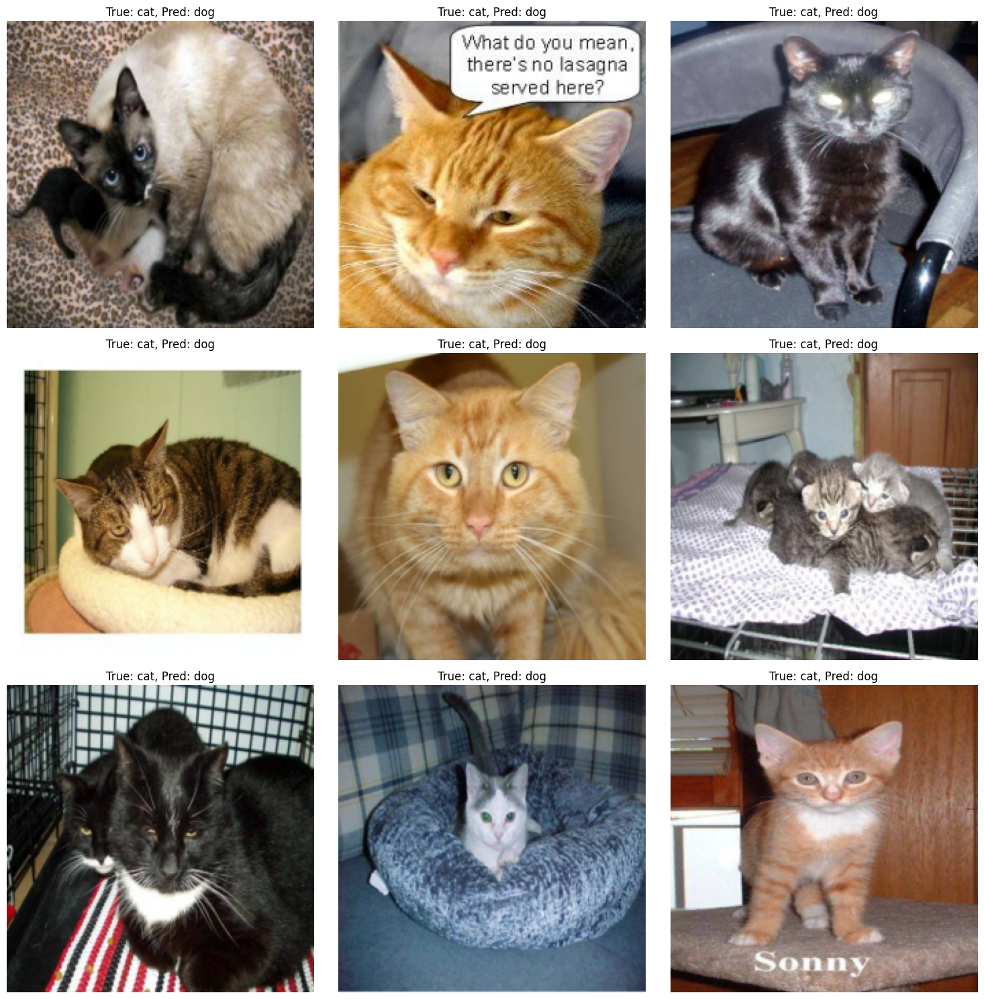

Incorrect examples for VGG13:


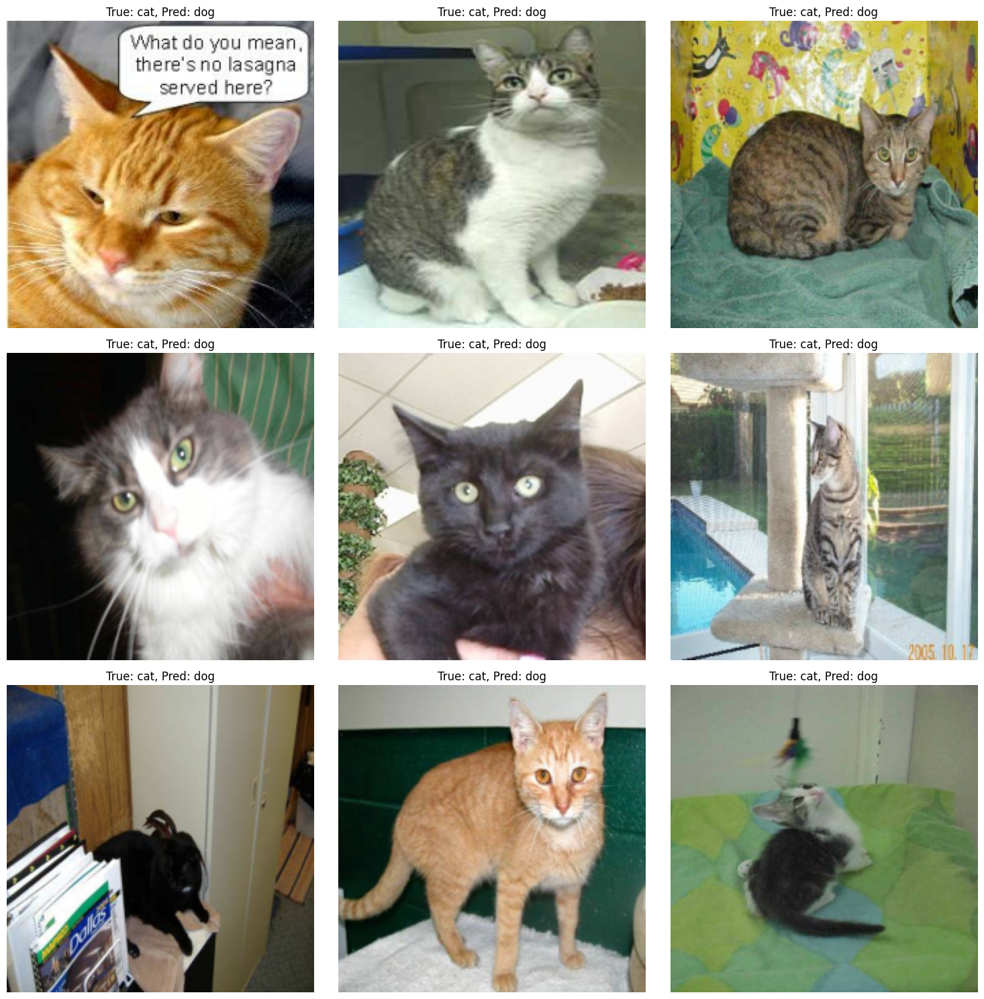

Incorrect examples for VGG16:


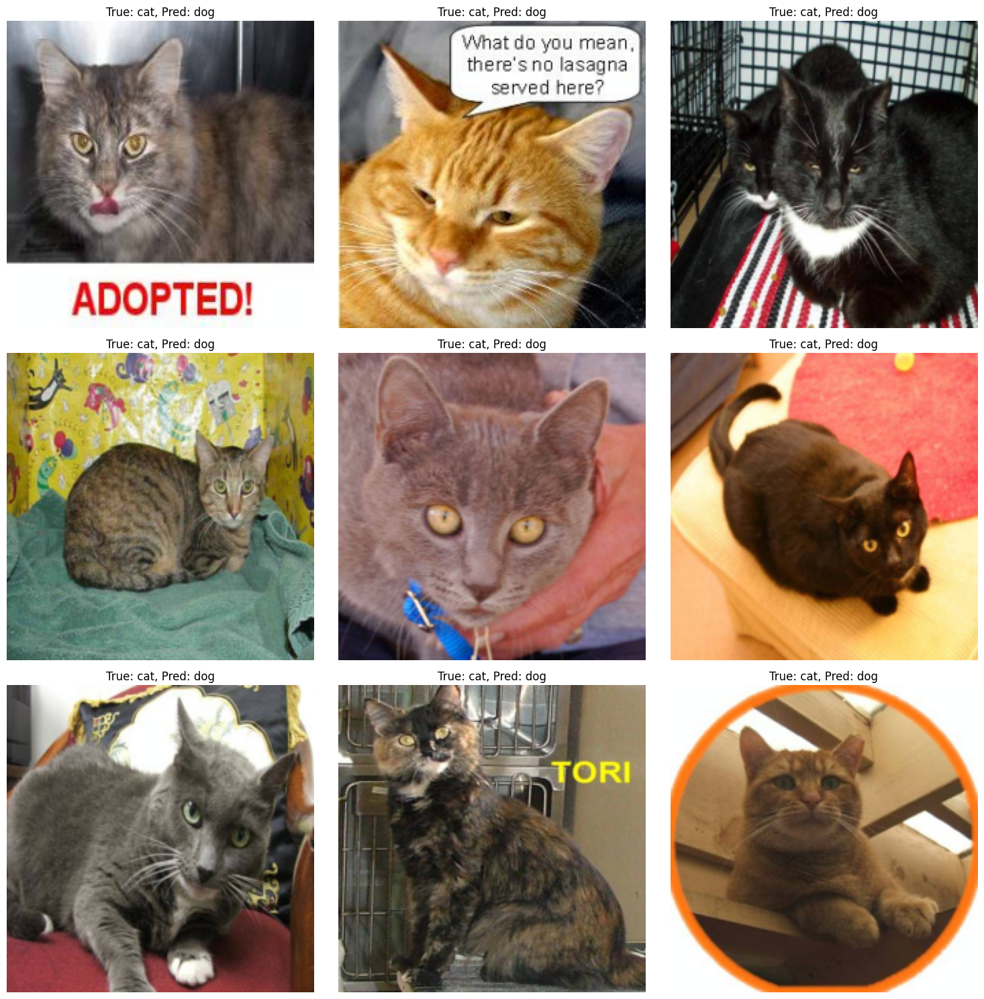

Incorrect examples for VGG19:


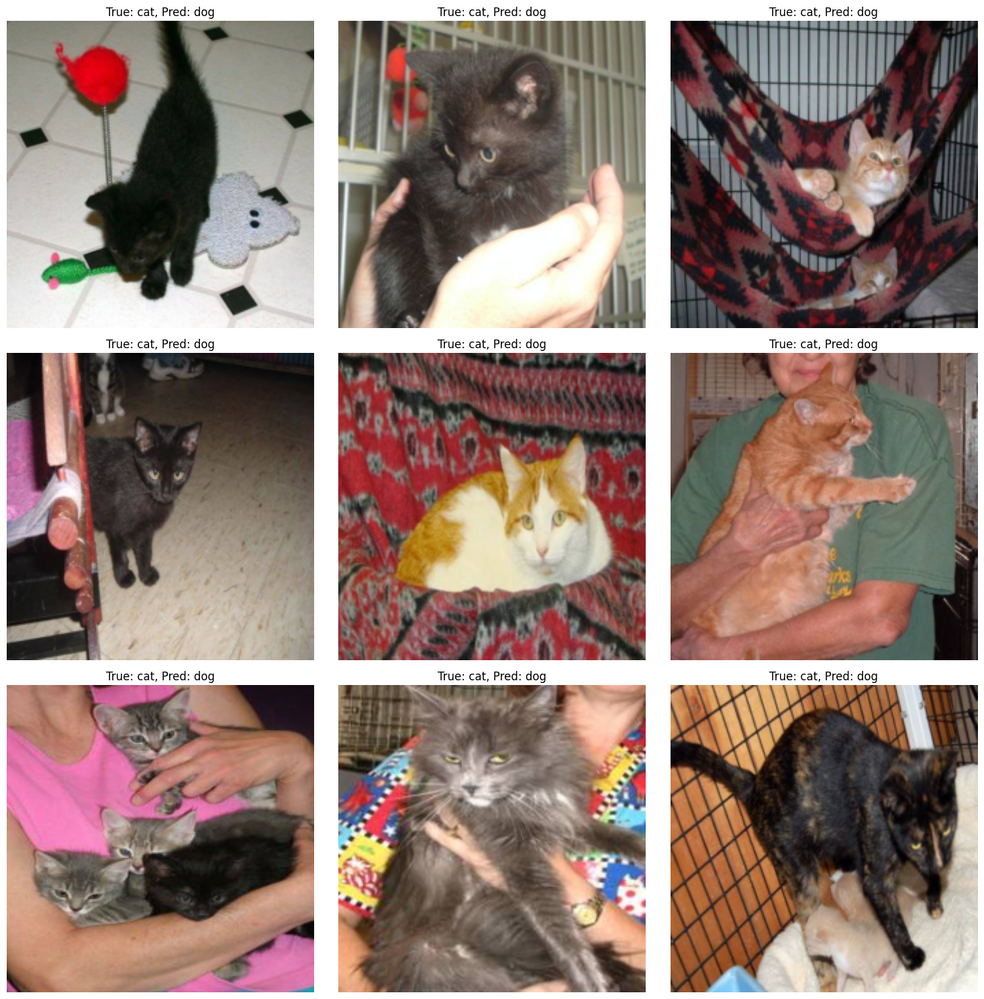

In [10]:
# Plot incorrect examples
def plot_incorrect_examples(incorrect_examples, class_names):
    fig, axes = plt.subplots(3, 3, figsize=(15, 15))
    axes = axes.flatten()
    for i, (img, true_label, pred_label) in enumerate(incorrect_examples[:9]):
        img = img.permute(1, 2, 0).numpy()
        img = img * np.array(pretrained_stds) + np.array(pretrained_means)
        img = np.clip(img, 0, 1)
        axes[i].imshow(img)
        axes[i].set_title(f'True: {class_names[true_label]}, Pred: {class_names[pred_label]}')
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

# Assuming class_names are ['cat', 'dog']
class_names = ['cat', 'dog']
for name, _, _, incorrect_examples in results:
    print(f'Incorrect examples for {name}:')
    plot_incorrect_examples(incorrect_examples, class_names)

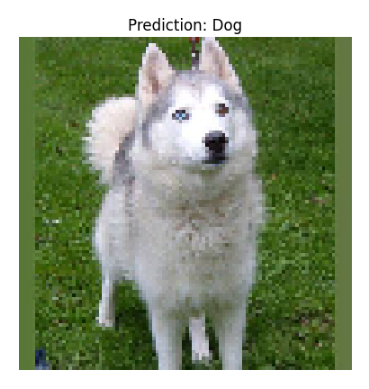

VGG11 → Dog (confidence: 1.0000)
VGG13 → Dog (confidence: 1.0000)
VGG16 → Cat (confidence: 0.5102)
VGG19 → Cat (confidence: 0.5203)


In [9]:
from PIL import Image

# ====== Load model ======
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
OUTPUT_DIM = 2  # vì dataset Cats vs Dogs

configs = {
    "VGG11": vgg11_config,
    "VGG13": vgg13_config,
    "VGG16": vgg16_config,
    "VGG19": vgg19_config,
}

models_dict = {}
for name, config in configs.items():
    layers = get_vgg_layers(config, batch_norm=True)
    model = VGG(layers, OUTPUT_DIM).to(device)

    model.load_state_dict(torch.load(os.path.join(save_path, f'{name}-model.pt')))
    # model.load_state_dict(torch.load(f"{name}-model.pt", map_location=device))
    model.eval()
    models_dict[name] = model

# ====== Dự đoán ảnh ======
transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406],
                         std=[0.229, 0.224, 0.225])
])

img_path = "Dog.png"
image = Image.open(img_path).convert("RGB")

# Hiển thị hình ảnh
plt.imshow(image)
plt.axis('off')  # Tắt các trục tọa độ
plt.show()
input_tensor = transform(image).unsqueeze(0).to(device)

class_names = ["Cat", "Dog"]  # thay nhãn theo dataset

with torch.no_grad():
    for name, model in models_dict.items():
        output, _ = model(input_tensor)
        probs = torch.softmax(output, dim=1)
        pred = torch.argmax(probs, dim=1).item()
        print(f"{name} → {class_names[pred]} (confidence: {probs[0][pred].item():.4f})")